In [1]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from lucent.modelzoo import inceptionv1
from lucent.optvis import render, param, transform, objectives

In [2]:
# Load model
device = "cuda" if torch.cuda.is_available() else "cpu"
model = inceptionv1(pretrained=True).to(device).eval()

 Goal: Find the image that maximally activates
   Layer: mixed4a
   Neuron (channel): 0

 Method: Start with random noise, then iteratively adjust
   pixels to increase the neuron's activation

   This is like asking the neuron: 'What do you want to see?'

Running basic activation maximization (this takes ~30 seconds)...
  Step 100/400, Activation: 4086.84
  Step 200/400, Activation: 5253.97
  Step 300/400, Activation: 5809.50
  Step 400/400, Activation: 6154.22


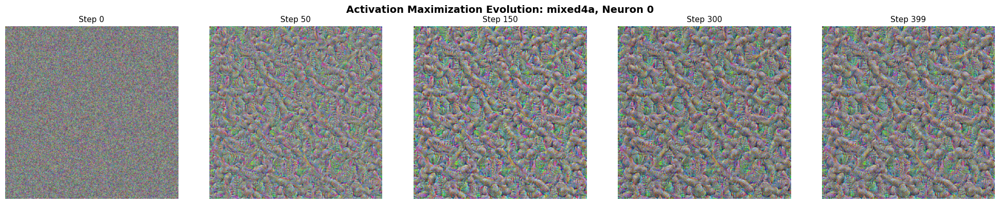

In [3]:
# The fundamental question:
# "What image pattern makes neuron X fire most strongly?"

# Let's start with a simple demonstration on ONE neuron
target_layer = "mixed4a"
target_neuron = 0

print(f" Goal: Find the image that maximally activates")
print(f"   Layer: {target_layer}")
print(f"   Neuron (channel): {target_neuron}")
print(f"\n Method: Start with random noise, then iteratively adjust")
print(f"   pixels to increase the neuron's activation")
print(f"\n   This is like asking the neuron: 'What do you want to see?'\n")

# Simple visualization: The optimization process
def simple_activation_max(model, layer_name, channel_idx, steps=512):
    """
    Minimal activation maximization to show the concept.
    Returns intermediate images to visualize the optimization process.
    """
    # Start with random noise - MUST be 224x224 for InceptionV1
    img = torch.randn(1, 3, 224, 224, requires_grad=True, device=device)
    optimizer = torch.optim.Adam([img], lr=0.05)
    
    # Hook to capture activations
    activations = {}
    def hook(module, input, output):
        activations['output'] = output
    
    # Register hook on target layer
    handle = None
    for name, module in model.named_modules():
        if name == layer_name:
            handle = module.register_forward_hook(hook)
            break
    
    if handle is None:
        raise ValueError(f"Layer {layer_name} not found in model")
    
    # Store snapshots during optimization
    snapshots = []
    snapshot_steps = [0, 50, 150, 300, steps-1]
    
    for step in range(steps):
        optimizer.zero_grad()
        
        # Forward pass
        _ = model(img)
        
        # Objective: maximize mean activation of target channel
        loss = -activations['output'][0, channel_idx].mean()
        loss.backward()
        optimizer.step()
        
        # Save snapshots
        if step in snapshot_steps:
            # Denormalize for visualization
            img_vis = img[0].detach().cpu().clone()
            img_vis = (img_vis - img_vis.min()) / (img_vis.max() - img_vis.min())
            snapshots.append((step, img_vis.permute(1, 2, 0).numpy()))
            
        # Progress indicator
        if (step + 1) % 100 == 0:
            print(f"  Step {step + 1}/{steps}, Activation: {-loss.item():.2f}")
    
    handle.remove()
    return snapshots

# Run simple optimization
print("Running basic activation maximization (this takes ~30 seconds)...")
snapshots = simple_activation_max(model, target_layer, target_neuron, steps=400)

# Visualize the evolution
fig, axes = plt.subplots(1, len(snapshots), figsize=(20, 4))
fig.suptitle(f'Activation Maximization Evolution: {target_layer}, Neuron {target_neuron}', 
             fontsize=14, weight='bold')

for idx, (step, img) in enumerate(snapshots):
    axes[idx].imshow(img)
    axes[idx].set_title(f'Step {step}', fontsize=11)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

## Observations:
   -  Started with random noise (step 0)
   -  Gradually reveals structure (steps 50-150)
   -  Converges to a pattern (step 399)
   - This pattern is what neuron 0 'wants to see'

It's still noisy and has artifacts, This is why we need better techniques

Generating activation maximizations for mixed4a neurons 0-9
   Using Lucent's optimized rendering pipeline
  Neuron 0... 

100%|██████████| 512/512 [01:53<00:00,  4.51it/s]


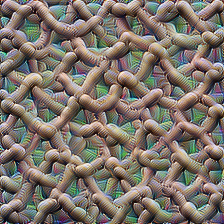

✓
  Neuron 1... 

100%|██████████| 512/512 [01:53<00:00,  4.51it/s]


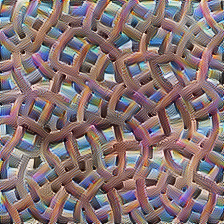

✓
  Neuron 2... 

100%|██████████| 512/512 [01:53<00:00,  4.49it/s]


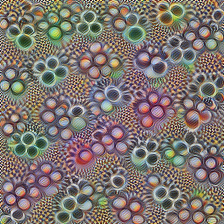

✓
  Neuron 3... 

100%|██████████| 512/512 [01:53<00:00,  4.51it/s]


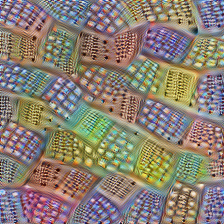

✓
  Neuron 4... 

100%|██████████| 512/512 [01:53<00:00,  4.51it/s]


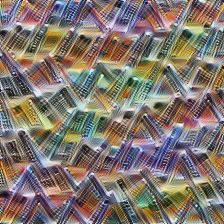

✓
  Neuron 5... 

100%|██████████| 512/512 [01:51<00:00,  4.59it/s]


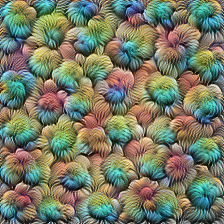

✓
  Neuron 6... 

100%|██████████| 512/512 [01:52<00:00,  4.56it/s]


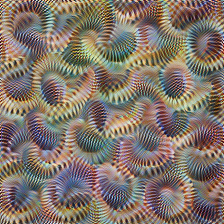

✓
  Neuron 7... 

100%|██████████| 512/512 [01:50<00:00,  4.65it/s]


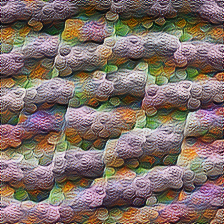

✓
  Neuron 8... 

100%|██████████| 512/512 [01:51<00:00,  4.59it/s]


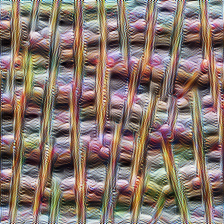

✓
  Neuron 9... 

100%|██████████| 512/512 [01:50<00:00,  4.63it/s]


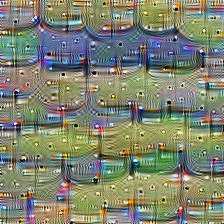

✓

 All visualizations complete!



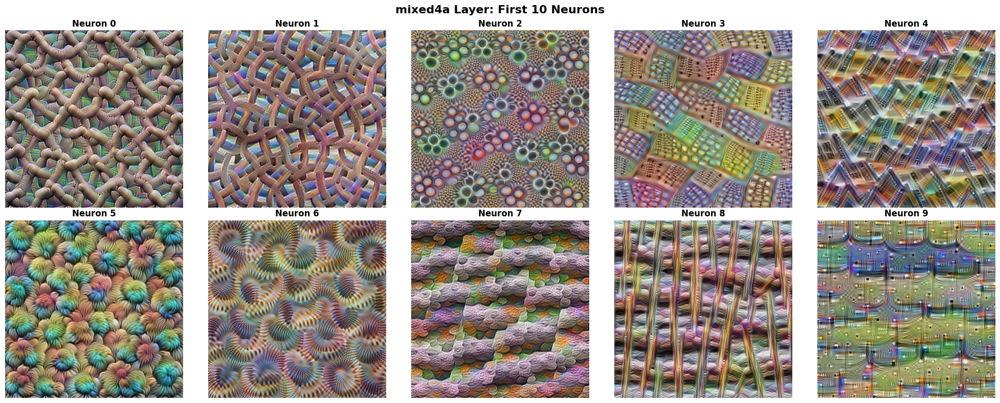

Saved as: mixed4a_neurons_0_to_9_lucent.png


In [4]:
print("Generating activation maximizations for mixed4a neurons 0-9")
print("   Using Lucent's optimized rendering pipeline")

# Helper function for clean visualization
def visualize_neuron_lucent(model, layer_name, neuron_idx, steps=512, size=224):
    """
    Generate high-quality activation maximization using Lucent.
    
    Args:
        model: InceptionV1 model
        layer_name: e.g., "mixed4a"
        neuron_idx: Channel index to visualize
        steps: Optimization steps (more = cleaner, slower)
        size: Output image size
    """
    # Define what to maximize
    objective_func = objectives.channel(layer_name, neuron_idx)
    
    # Render with Lucent's best practices
    images = render.render_vis(
        model,
        objective_func,
        param_f=lambda: param.image(size, batch=1, fft=True, decorrelate=True),
        transforms=transform.standard_transforms,
        thresholds=[steps],
        verbose=False,
        show_inline=False
    )
    
    return images[0][0]  # Return final image

# Generate visualizations for neurons 0-9
neurons_to_viz = range(10)
visualizations = []

for neuron_idx in neurons_to_viz:
    print(f"  Neuron {neuron_idx}...", end=" ", flush=True)
    img = visualize_neuron_lucent(model, target_layer, neuron_idx, steps=512)
    visualizations.append((neuron_idx, img))
    print("✓")

print("\n All visualizations complete!\n")

# Display results
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
fig.suptitle(f'{target_layer} Layer: First 10 Neurons', 
             fontsize=16, weight='bold')

for idx, (neuron_idx, img) in enumerate(visualizations):
    row, col = idx // 5, idx % 5
    axes[row, col].imshow(img)
    axes[row, col].set_title(f'Neuron {neuron_idx}', fontsize=12, weight='bold')
    axes[row, col].axis('off')

plt.tight_layout()
plt.savefig('mixed4a_neurons_0_to_9_lucent.png', dpi=150, bbox_inches='tight')
plt.show()

print("Saved as: mixed4a_neurons_0_to_9_lucent.png")

Interactive Analysis of Activation Maximizations



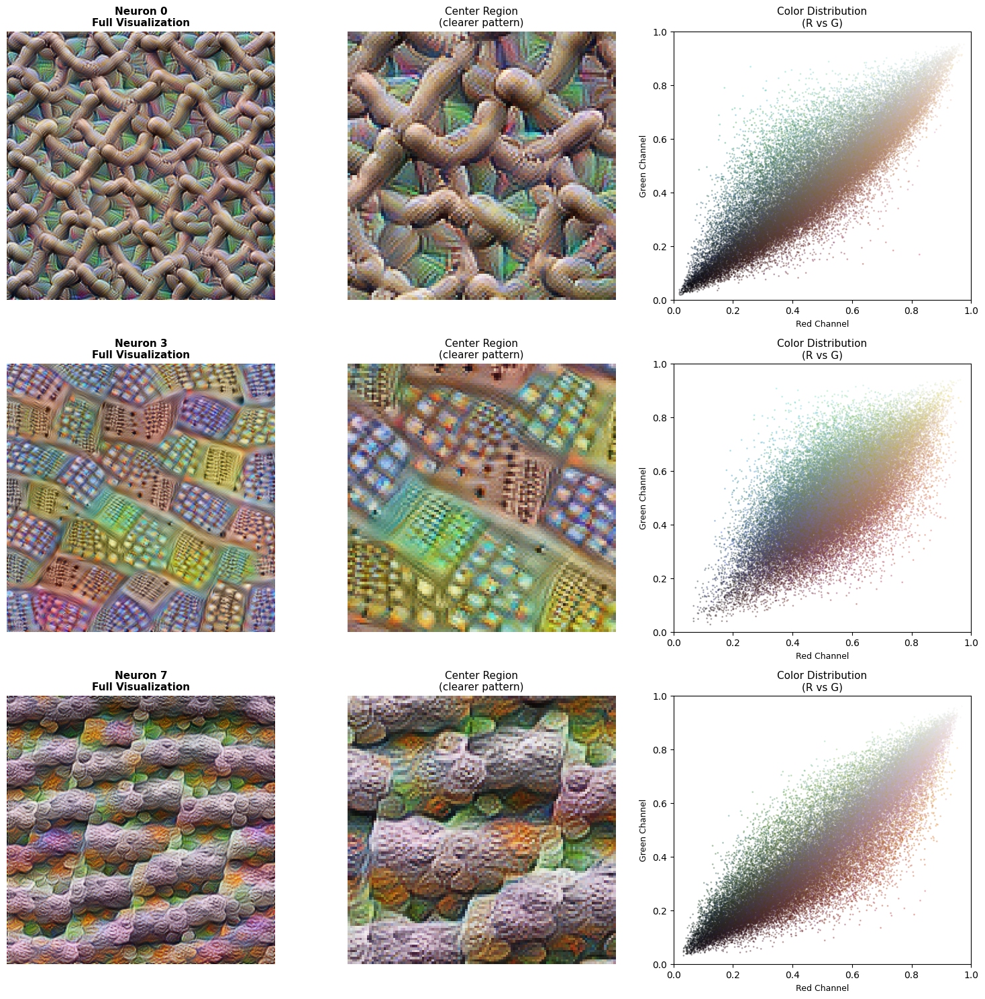

In [5]:
print("Interactive Analysis of Activation Maximizations\n")

# Choose a few interesting neurons to examine closely
interesting_neurons = [0, 3, 7]  # Modify based on what looks interesting!

fig, axes = plt.subplots(len(interesting_neurons), 3, figsize=(15, 5*len(interesting_neurons)))
if len(interesting_neurons) == 1:
    axes = axes.reshape(1, -1)

for plot_idx, neuron_idx in enumerate(interesting_neurons):
    img = visualizations[neuron_idx][1]
    
    # Original visualization
    axes[plot_idx, 0].imshow(img)
    axes[plot_idx, 0].set_title(f'Neuron {neuron_idx}\nFull Visualization', 
                                fontsize=11, weight='bold')
    axes[plot_idx, 0].axis('off')
    
    # Zoom into center (where patterns are often clearest)
    h, w = img.shape[0], img.shape[1]
    center_crop = img[h//4:3*h//4, w//4:3*w//4]
    axes[plot_idx, 1].imshow(center_crop)
    axes[plot_idx, 1].set_title(f'Center Region\n(clearer pattern)', fontsize=11)
    axes[plot_idx, 1].axis('off')
    
    # Analyze color/texture distribution
    img_flat = img.reshape(-1, 3)
    axes[plot_idx, 2].scatter(img_flat[:, 0], img_flat[:, 1], 
                              c=img_flat, s=1, alpha=0.3)
    axes[plot_idx, 2].set_title(f'Color Distribution\n(R vs G)', fontsize=11)
    axes[plot_idx, 2].set_xlabel('Red Channel', fontsize=9)
    axes[plot_idx, 2].set_ylabel('Green Channel', fontsize=9)
    axes[plot_idx, 2].set_xlim([0, 1])
    axes[plot_idx, 2].set_ylim([0, 1])

plt.tight_layout()
plt.show()

Cross-Layer Comparison: How do features evolve?
   Visualizing 3 neurons from 3 different layers

  mixed3b (neuron 5)... 

100%|██████████| 384/384 [01:20<00:00,  4.74it/s]


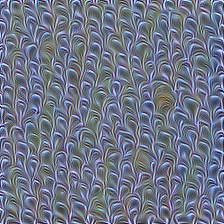

✓
  mixed4a (neuron 5)... 

100%|██████████| 384/384 [01:24<00:00,  4.56it/s]


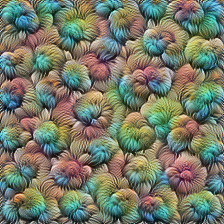

✓
  mixed4c (neuron 5)... 

100%|██████████| 384/384 [01:30<00:00,  4.23it/s]


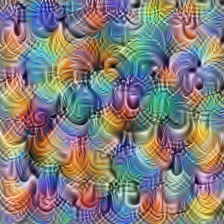

✓


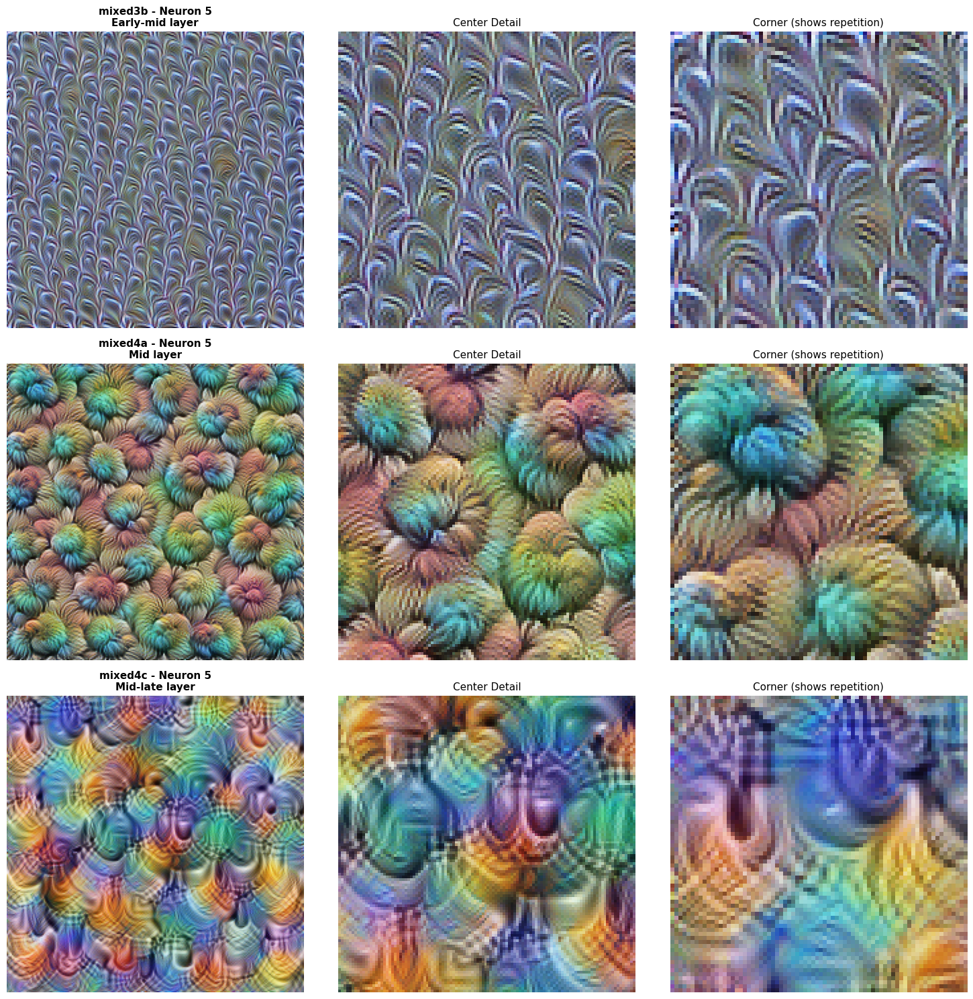

In [6]:
# Let's compare what neurons look for at different depths
# This reinforces the hierarchy from Segment 1

print("Cross-Layer Comparison: How do features evolve?")
print("   Visualizing 3 neurons from 3 different layers\n")

layers_to_compare = [
    ("mixed3b", "Early-mid layer"),
    ("mixed4a", "Mid layer"),  
    ("mixed4c", "Mid-late layer")
]

sample_neurons = [5, 5, 5]  # Same index across layers for consistency

fig, axes = plt.subplots(len(layers_to_compare), 3, figsize=(15, 5*len(layers_to_compare)))

for layer_idx, ((layer_name, layer_desc), neuron_idx) in enumerate(zip(layers_to_compare, sample_neurons)):
    print(f"  {layer_name} (neuron {neuron_idx})...", end=" ", flush=True)
    
    # Generate visualization
    img = visualize_neuron_lucent(model, layer_name, neuron_idx, steps=384, size=224)
    
    # Full image
    axes[layer_idx, 0].imshow(img)
    axes[layer_idx, 0].set_title(f'{layer_name} - Neuron {neuron_idx}\n{layer_desc}', 
                                  fontsize=11, weight='bold')
    axes[layer_idx, 0].axis('off')
    
    # Center crop
    h, w = img.shape[0], img.shape[1]
    center = img[h//4:3*h//4, w//4:3*w//4]
    axes[layer_idx, 1].imshow(center)
    axes[layer_idx, 1].set_title('Center Detail', fontsize=11)
    axes[layer_idx, 1].axis('off')
    
    # Edge crop (show repetition)
    corner = img[0:h//3, 0:w//3]
    axes[layer_idx, 2].imshow(corner)
    axes[layer_idx, 2].set_title('Corner (shows repetition)', fontsize=11)
    axes[layer_idx, 2].axis('off')
    
    print("✓")

plt.tight_layout()
plt.savefig('layer_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

 ## Key Observations:
   -  Earlier layers: Simpler patterns (edges, simple textures)
   -  Later layers: More complex patterns (object parts, compositions)
   -  Receptive field size: Notice how pattern scale changes

This confirms the hierarchy we saw in Segment 1, Features compose: simple → complex → object parts